In [11]:
import pandas as pd
from pandas import DataFrame
import numpy as np
import scanpy as sc
import scanpy.external as sce
#pd.set_option('display.max_rows', 40)
#pd.set_option('display.max_columns', None)
import pickle as pkl
import matplotlib.pyplot as plt
from matplotlib.sankey import Sankey
#plt.rcParams['figure.figsize'] = [10,8]
import seaborn as sns
# from collections import defaultdict, Counter
import networkx as nx
import igraph, re, glob
from bbknn import bbknn
from geosketch import gs
import scrublet as scr
import joblib as jl
from datetime import datetime
def timestamp():
    return datetime.now().strftime("%y%m%d%H%M")
import logging
import scipy.stats
import infercnvpy as cnv
import os, warnings
import anndata

## InferCNVpy_Lung_dataset_wise

### 1. InferCNV Parameter optimization

CCA 데이터를 데이터셋 별로 분리하고 각 데이터셋에 대해 inferCNV 분석을 최적화된 파라미터로 실시.

### 2. 데이터셋 별 InferCNV 실시

각각의 데이터셋에 대해 독립적으로 inferCNV 분석을 수행하여 세포 유형의 복사 수 변이(Copy Number Variation)를 확인.

### 3. 데이터 별 Heatmap 및 CNV Score UMAP 확인

데이터셋 별로 heatmap과 cnv_score를 이용한 UMAP 시각화를 통해 tumor cell의 annotation 검토 및 확인.

### 4. Epithelial 세포 중 Tumor cell annotation

Epithelial 세포들 중에서 복사 수 변이를 기반으로 tumor cell 식별하고 annotation.

Cell type
- T : 199542
- Myeloid : 121878
- tumor : 51046
- Epi : 37034
- B : 40644
- Fibroblast : 12278
- Endo : 10099
- Mast : 9830

In [2]:
os.getcwd()

'/home/nccpml/DATA2/hanbyeol/TEC'

## Load scRNA data from CCA

In [3]:
# 로드
path = '/home/nccpml/DATA2/hanbyeol/TEC/h5ad_data/'
adata = sc.read(path + 'CCA_Lung_reanno_0424.h5ad')

In [4]:
print(adata.obs['cell_type_major'].value_counts())
print(adata.obs['cell_type_minor'].value_counts())
print(adata.obs['cell_type_subset'].value_counts())

cell_type_major
TandNK         198923
Myeloid        131640
Epithelial      88923
B               40659
Fibro_Peri      12174
Endothelial     10032
Name: count, dtype: int64
cell_type_minor
TandNK        198923
Myeloid       131640
Epithelial     88923
B              40659
Fibro_Peri     12174
NEC             6469
TEC             3563
Name: count, dtype: int64
cell_type_subset
TandNK                 198923
Myeloid                131640
Epithelial              88923
B                       40659
Fibro_Peri              12174
activated capillary      4066
Immature_Phenotype       2288
capillary type I         1619
capillary type II         784
Tip_Cells                 736
Activated_EC              539
Name: count, dtype: int64


In [5]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, n_top_genes = 2000)

In [6]:
# # 'column1', 'column2', 'column3' 컬럼을 한 번에 삭제
# re_list = ['doublet_scores', 'predicted_doublets', 'Anno_low', 'Anno_high', 'Platform', 'Meta_site', 'Treatment', 'Immunotherapy',
#           'Response', 'CancerAbbr', 'OrgTis', 'Status', 'Sample_Origin', 'Diagnosis', 'anno_new', 'anno_final2207', 
#            'anno_figure', 'anno_specific', 'anno_fig_specific', 'anno_2211', 'F1C', 'anno_cat', 'anno_2212']

# adata.obs.drop(re_list, axis=1, inplace=True)

# # 'cnv_status'라는 새 컬럼을 NaN 값으로 추가
adata.obs['cnv_status'] = np.nan
adata.obs['cnv_score'] = np.nan
adata.obs['cnv_leiden'] = np.nan

## Preparing the GTF file for genomic location information

In [7]:
#genome info AnnData에 저장
add = '/home/nccpml/DATA1/DB/' 

gtf_file = add+'gencode.v29.annotation.gtf'

cnv.io.genomic_position_from_gtf(gtf_file, adata=adata, gtf_gene_id='gene_name', inplace=False)#, adata_gene_id=None, inplace=True)

INFO:root:Extracted GTF attributes: ['gene_id', 'gene_type', 'gene_name', 'level', 'havana_gene', 'transcript_id', 'transcript_type', 'transcript_name', 'transcript_support_level', 'tag', 'havana_transcript', 'exon_number', 'exon_id', 'ont', 'protein_id', 'ccdsid']


,highly_variable,means,dispersions,dispersions_norm,chromosome_x,start_x,end_x,gene_id_x,gene_name_x,chromosome_y,start_y,end_y,gene_id_y,gene_name_y
MIR1302-2HG,False,1.000000e-12,NaN,NaN,chr1,29554.0,31109.0,ENSG00000243485.5,MIR1302-2HG,chr1,29554.0,31109.0,ENSG00000243485.5,MIR1302-2HG
FAM138A,False,1.000000e-12,NaN,NaN,chr1,34554.0,36081.0,ENSG00000237613.2,FAM138A,chr1,34554.0,36081.0,ENSG00000237613.2,FAM138A
OR4F5,False,1.000000e-12,NaN,NaN,chr1,65419.0,71585.0,ENSG00000186092.6,OR4F5,chr1,65419.0,71585.0,ENSG00000186092.6,OR4F5
AL627309.1,False,1.991708e-03,1.630030,0.049693,chr1,89295.0,133723.0,ENSG00000238009.6,AL627309.1,chr1,89295.0,133723.0,ENSG00000238009.6,AL627309.1
AL627309.3,False,1.305254e-04,1.535243,-0.141222,chr1,89551.0,91105.0,ENSG00000239945.1,AL627309.3,chr1,89551.0,91105.0,ENSG00000239945.1,AL627309.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AC141272.1,False,3.179134e-04,2.037556,0.870517,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AC023491.2,False,7.223746e-05,1.256876,-0.701900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AC007325.1,False,5.804845e-05,1.407784,-0.397945,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AC007325.4,False,1.258567e-01,1.697240,0.185066,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Dataset InferCNV

In [10]:
# adata dataset별로 나누기

##adata = adata[adata.obs['Dataset'].isin(['pan_GSE140819'])]

# adata_by_dataset = {}

# # 각 데이터셋에 대한 부분집합 생성
# for dataset in datasets:
#     adata_by_dataset[dataset] = adata[adata.obs['Dataset'] == dataset]
    
# # 결과 확인
# for dataset, subset_adata in adata_by_dataset.items():
#     print(f"Dataset: {dataset}, Number of cells: {len(subset_adata)}")
# adata_by_dataset['pan_GSE140819']

# 'Dataset' 열에서 중복된 값을 제거
datasets = adata.obs['Dataset'].drop_duplicates().tolist()

adata_by_dataset = {}

# 각 데이터셋에 대한 부분집합 생성
for dataset in datasets:
    adata_by_dataset[dataset] = adata[adata.obs['Dataset'] == dataset]
    globals()[f"adata_by_{dataset}"] = adata_by_dataset[dataset]

# 결과 확인
for dataset, subset_adata in adata_by_dataset.items():
    print(f"Dataset: {dataset}, Number of cells: {len(subset_adata)}")

Dataset: pan_GSE140819, Number of cells: 17407
Dataset: lu_adc_GSE123902, Number of cells: 32234
Dataset: lu_HRA000154, Number of cells: 57156
Dataset: lung_hca_vieira, Number of cells: 12633
Dataset: lu_adc_GSE131907, Number of cells: 178644
Dataset: lu_adc_codeocean, Number of cells: 107191
Dataset: lu_adc_GSE146100, Number of cells: 10515
Dataset: lu_nsclc_pan_blueprint_lung, Number of cells: 66571


In [11]:
#adata의 부분집합 세포유형 확인

for dataset, subset_adata in adata_by_dataset.items():
    cell_types = subset_adata.obs['cell_type_major'].unique()
    cell_types_list = sorted(cell_types.tolist())  # 카테고리를 리스트로 변환하고 정렬
    print(f"Dataset: {dataset}\nCell Types: {cell_types_list}\n")

Dataset: pan_GSE140819
Cell Types: ['B', 'Endothelial', 'Epithelial', 'Fibro_Peri', 'Myeloid', 'TandNK']

Dataset: lu_adc_GSE123902
Cell Types: ['B', 'Endothelial', 'Epithelial', 'Fibro_Peri', 'Myeloid', 'TandNK']

Dataset: lu_HRA000154
Cell Types: ['B', 'Endothelial', 'Epithelial', 'Fibro_Peri', 'Myeloid', 'TandNK']

Dataset: lung_hca_vieira
Cell Types: ['B', 'Endothelial', 'Epithelial', 'Fibro_Peri', 'Myeloid', 'TandNK']

Dataset: lu_adc_GSE131907
Cell Types: ['B', 'Endothelial', 'Epithelial', 'Fibro_Peri', 'Myeloid', 'TandNK']

Dataset: lu_adc_codeocean
Cell Types: ['B', 'Endothelial', 'Epithelial', 'Fibro_Peri', 'Myeloid', 'TandNK']

Dataset: lu_adc_GSE146100
Cell Types: ['B', 'Endothelial', 'Epithelial', 'Fibro_Peri', 'Myeloid', 'TandNK']

Dataset: lu_nsclc_pan_blueprint_lung
Cell Types: ['B', 'Endothelial', 'Epithelial', 'Fibro_Peri', 'Myeloid', 'TandNK']



## Set analysis parameters

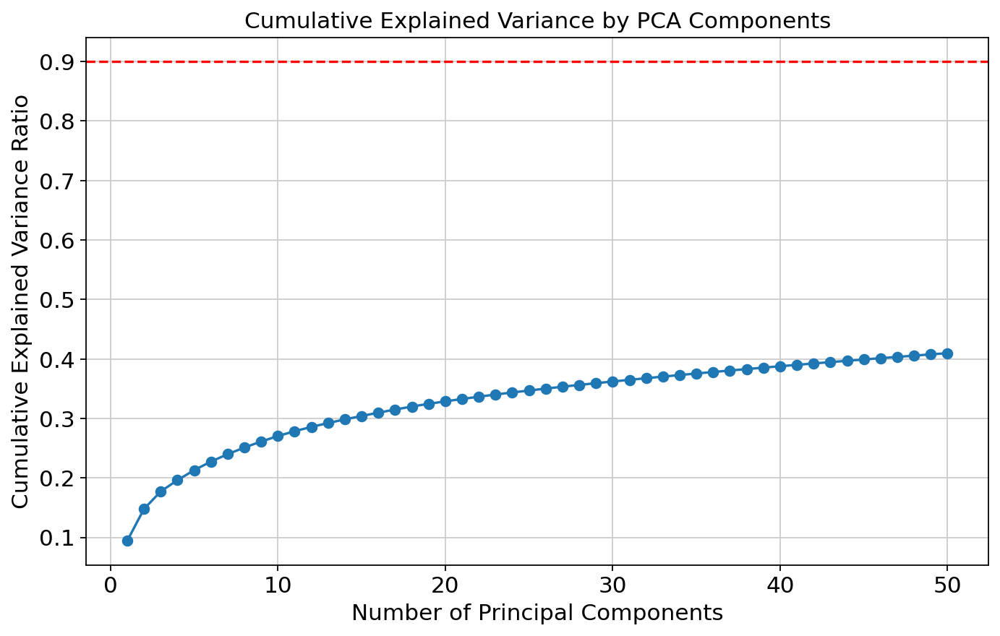

No components explain more than 90% of variance.
Maximum cumulative variance explained by all components: 40.98%


In [238]:
# PCA 실행
sc.tl.pca(adata_tmp, svd_solver='arpack')
sc.pp.scale(adata_tmp, max_value=10)

# 설명된 분산 비율 추출
explained_var_ratio = adata_tmp.uns['pca']['variance_ratio']

# 누적 설명된 분산 계산
cumulative_var_ratio = np.cumsum(explained_var_ratio)

# 누적 설명된 분산 비율 시각화
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(cumulative_var_ratio) + 1), cumulative_var_ratio, marker='o')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('Cumulative Explained Variance by PCA Components')
plt.axhline(y=0.9, color='r', linestyle='--')  # 90% 누적 분산을 나타내는 선
plt.grid(True)
plt.show()

# 주성분의 수 결정하기: 90% 누적 분산을 초과하는 최소 주성분 수
indices = np.where(cumulative_var_ratio > 0.9)[0]
if indices.size > 0:
    n_components = indices[0] + 1
    print(f"Number of components to explain 90% of variance: {n_components}")
else:
    print("No components explain more than 90% of variance.")
    print(f"Maximum cumulative variance explained by all components: {cumulative_var_ratio[-1]*100:.2f}%")

In [242]:
## param
ref_key = 'cell_type_major'
ref_types = ['T', 'Myeloid', 'B', 'Fibroblast', 'Mast', 'Endo']
use_ref = True

N_pca_comp = 15
N_neighbors = 10
Window_size = 150

In [243]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    cnv.tl.infercnv(dataset, 
                    reference_key = ref_key, 
                    reference_cat = ref_types, 
                    window_size = Window_size)

# PCA, 이웃 찾기, 클러스터링, UMAP, CNV 점수 계산
# PCA, neighbors, leiden, UMAP, cnv_score 계산
cnv.tl.pca(dataset, n_comps = N_pca_comp) 
cnv.pp.neighbors(dataset, key_added = 'cnv_neighbors', n_neighbors=N_neighbors, n_pcs=N_pca_comp)
cnv.tl.leiden(dataset, neighbors_key='cnv_neighbors', key_added='cnv_leiden', resolution = 1)

cnv.tl.umap(dataset, neighbors_key='cnv_neighbors')
cnv.tl.cnv_score(dataset, groupby = 'cnv_leiden', key_added = 'cnv_score')

  0%|          | 0/4 [00:00<?, ?it/s]

/home/hanbyeol/.conda/envs/py39/lib/python3.9/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


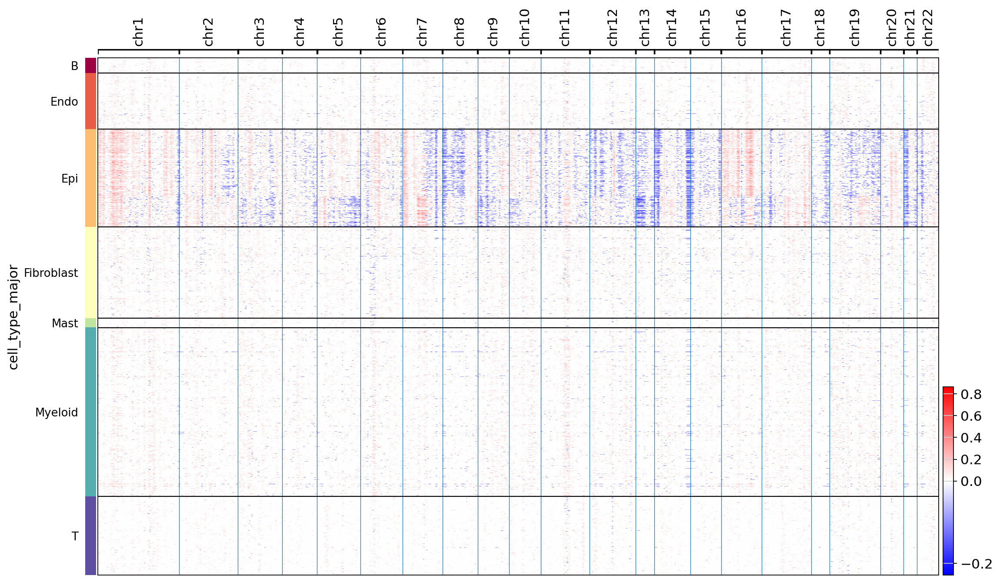

In [246]:
cnv.pl.chromosome_heatmap(dataset, groupby="cell_type_major")

/home/hanbyeol/.conda/envs/py39/lib/python3.9/site-packages/scanpy/tools/_dendrogram.py:135: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_df = rep_df.groupby(level=0).mean()


categories: 0, 1, 2, etc.
var_group_labels: chr1, chr2, chr3, etc.


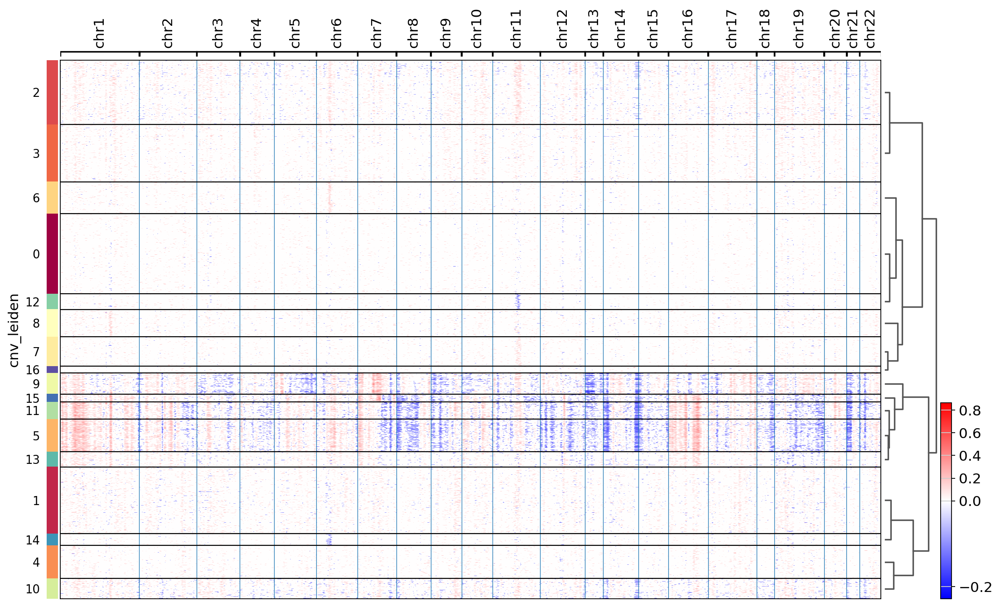

In [247]:
sc.tl.dendrogram(dataset, groupby='cnv_leiden')
cnv.pl.chromosome_heatmap(dataset, groupby="cnv_leiden", dendrogram=True)

/home/hanbyeol/.conda/envs/py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/hanbyeol/.conda/envs/py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


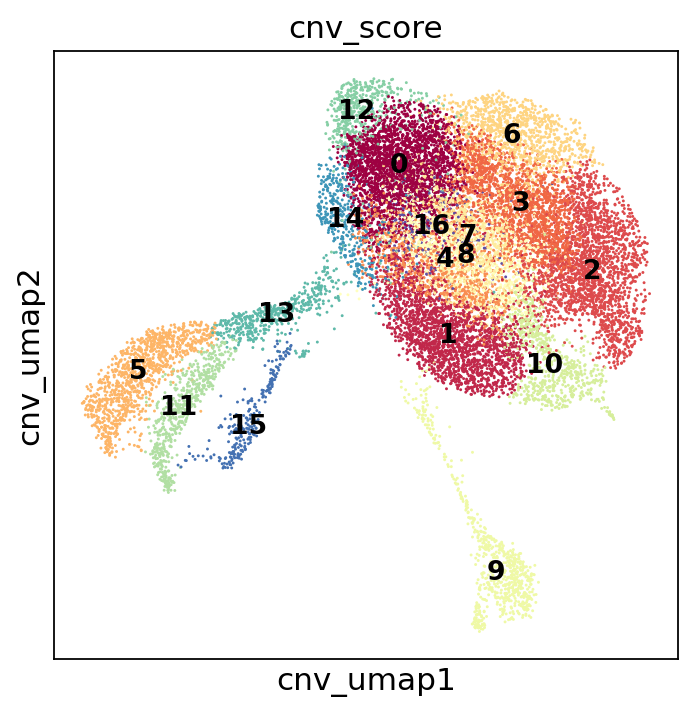

/home/hanbyeol/.conda/envs/py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/hanbyeol/.conda/envs/py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/hanbyeol/.conda/envs/py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_m

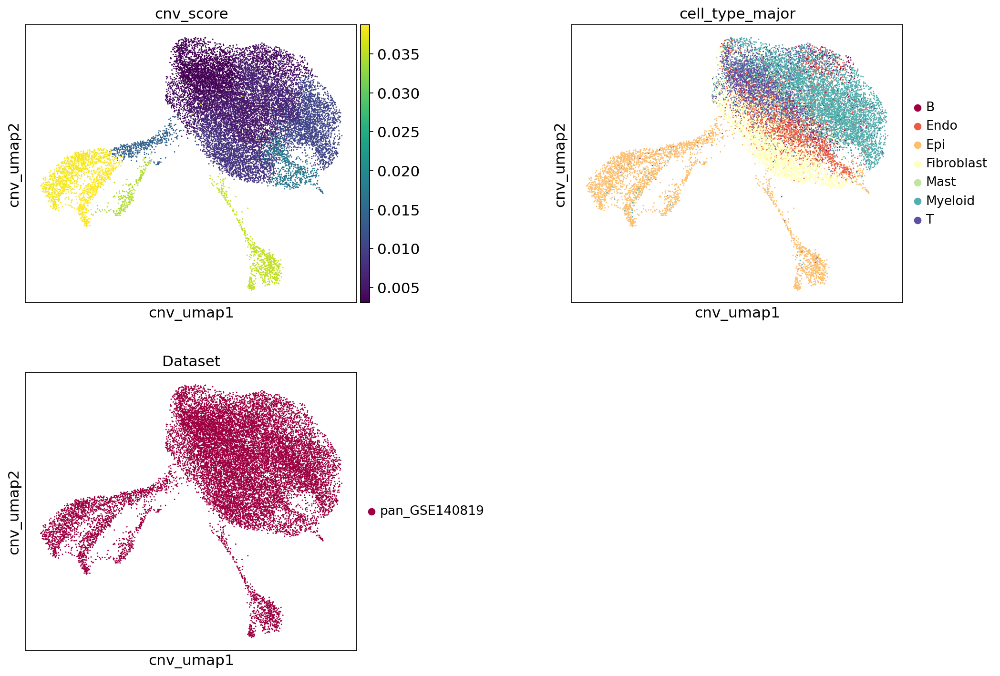

In [244]:
c_target = ['cnv_score', 'cell_type_major', 'Dataset']

sc.settings.set_figure_params(figsize=(5, 5), dpi=80, facecolor='white')
cnv.pl.umap(dataset, color="cnv_leiden", legend_loc="on data", 
           wspace = 0.5,
           legend_fontsize = 12, title = c_target, 
           ncols = 2, palette = 'Spectral') 
cnv.pl.umap(dataset, color=c_target, wspace = 0.5,
           legend_fontsize = 12, title = c_target, 
           ncols = 2, palette = 'Spectral') 

/home/hanbyeol/.conda/envs/py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/hanbyeol/.conda/envs/py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/hanbyeol/.conda/envs/py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_m

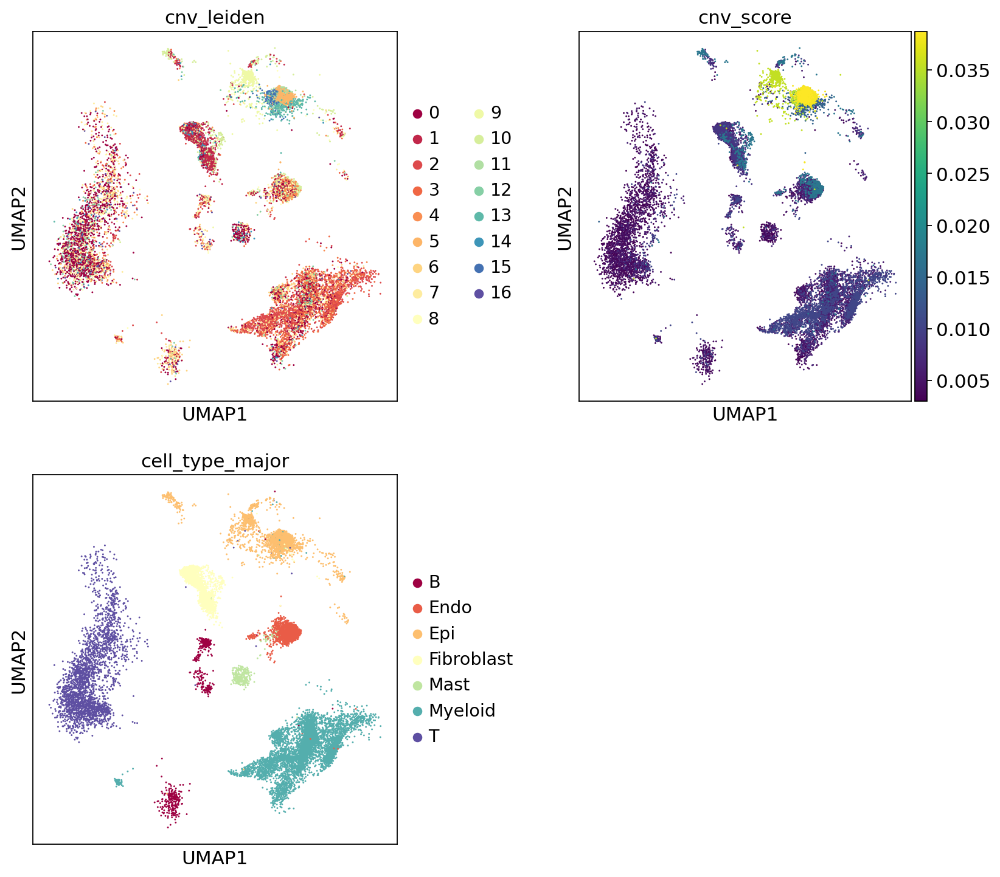

In [245]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(12, 11), gridspec_kw={"wspace": 0.5})
ax4.axis("off")
sc.pl.umap(dataset, color="cnv_leiden", ax=ax1, show=False)
sc.pl.umap(dataset, color="cnv_score", ax=ax2, show=False)
sc.pl.umap(dataset, color="cell_type_major", ax=ax3)

/home/hanbyeol/.conda/envs/py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/hanbyeol/.conda/envs/py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


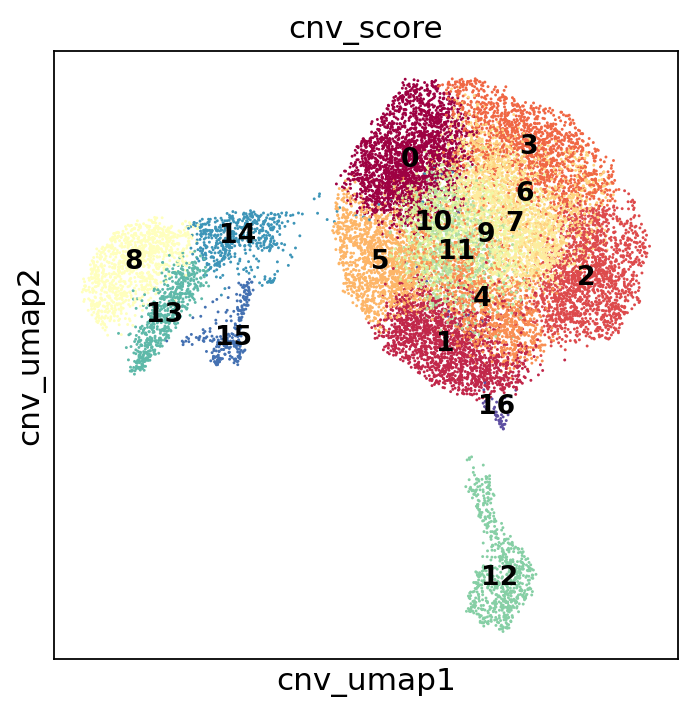

/home/hanbyeol/.conda/envs/py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/hanbyeol/.conda/envs/py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/hanbyeol/.conda/envs/py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_m

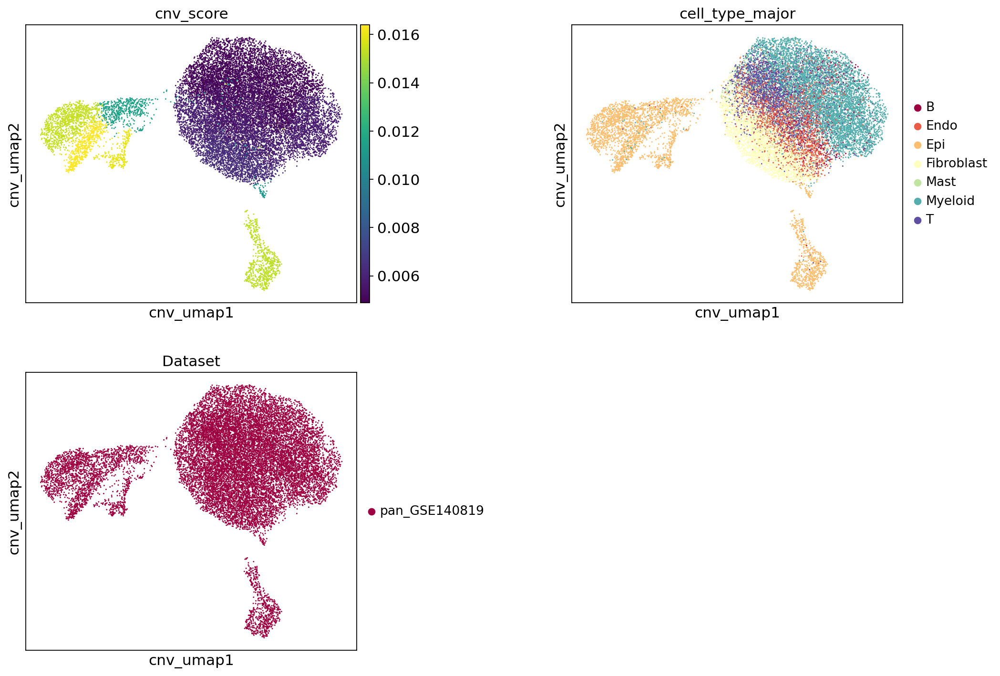

In [222]:
c_target = ['cnv_score', 'cell_type_major', 'Dataset']

sc.settings.set_figure_params(figsize=(5, 5), dpi=80, facecolor='white')
cnv.pl.umap(dataset, color="cnv_leiden", legend_loc="on data", 
           wspace = 0.5,
           legend_fontsize = 12, title = c_target, 
           ncols = 2, palette = 'Spectral') 
cnv.pl.umap(dataset, color=c_target, wspace = 0.5,
           legend_fontsize = 12, title = c_target, 
           ncols = 2, palette = 'Spectral') 

/home/hanbyeol/.conda/envs/py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/hanbyeol/.conda/envs/py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/hanbyeol/.conda/envs/py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_m

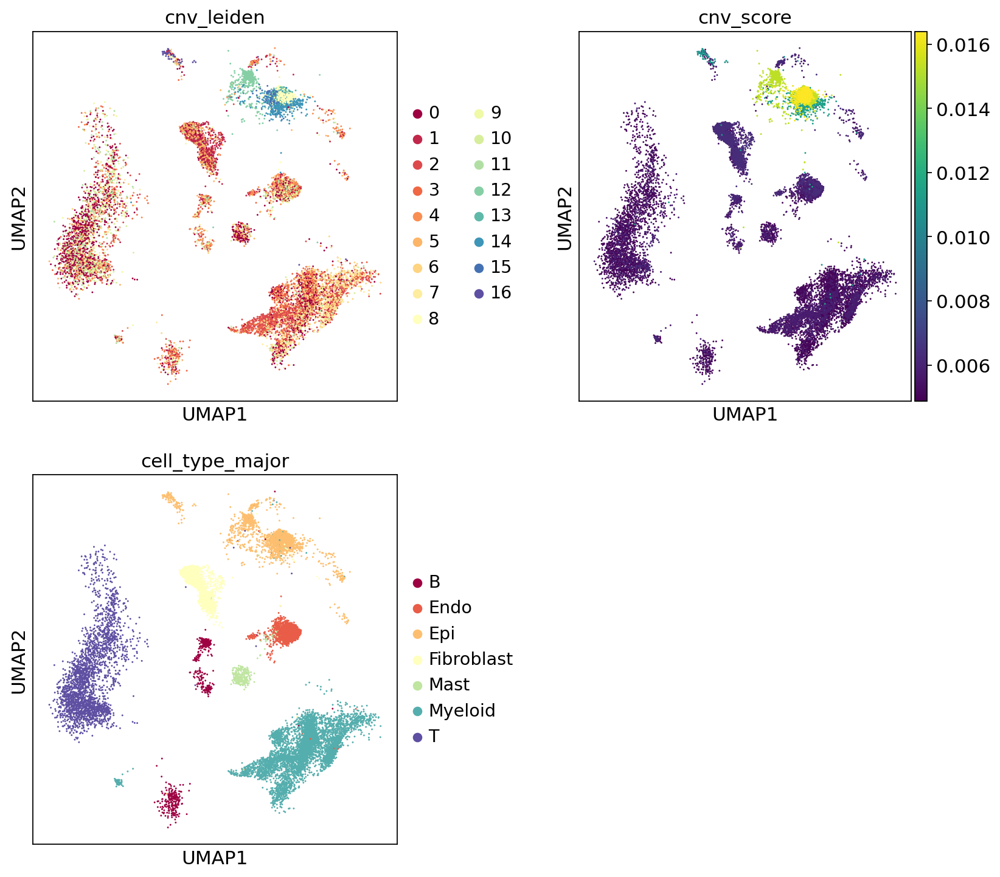

In [223]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(12, 11), gridspec_kw={"wspace": 0.5})
ax4.axis("off")
sc.pl.umap(dataset, color="cnv_leiden", ax=ax1, show=False)
sc.pl.umap(dataset, color="cnv_score", ax=ax2, show=False)
sc.pl.umap(dataset, color="cell_type_major", ax=ax3)

## All dataset wise

In [12]:
## param
ref_key = 'cell_type_major'
ref_types = ['B', 'Endothelial', 'Fibro_Peri', 'Myeloid', 'TandNK']
use_ref = True

N_pca_comp = 15
N_neighbors = 10
Window_size = 150

In [13]:
# 각 데이터셋에 대해 반복
for dataset_name, dataset in adata_by_dataset.items():
    # infercnv 분석 수행   
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        cnv.tl.infercnv(dataset, 
                        reference_key = ref_key, 
                        reference_cat = ref_types, 
                        window_size = Window_size)
    
    # PCA, 이웃 찾기, 클러스터링, UMAP, CNV 점수 계산
    # PCA, neighbors, leiden, UMAP, cnv_score 계산
    cnv.tl.pca(dataset, n_comps = N_pca_comp) 
    cnv.pp.neighbors(dataset, key_added = 'cnv_neighbors', n_neighbors=N_neighbors, n_pcs=N_pca_comp)
    cnv.tl.leiden(dataset, neighbors_key='cnv_neighbors', key_added='cnv_leiden', resolution = 1)
    
    cnv.tl.umap(dataset, neighbors_key='cnv_neighbors')
    cnv.tl.cnv_score(dataset, groupby = 'cnv_leiden', key_added = 'cnv_score')

# # 모든 데이터셋을 하나의 AnnData 객체로 합치기
# all_datasets = list(adata_by_dataset.values())  # dict_values를 list로 변환
# combined_adata = all_datasets[0].concatenate(*all_datasets[1:], index_unique=None)

# # 결과 확인
# print(combined_adata)
    # # cnv_score를 기반으로 cnv_status 업데이트
    # dataset.obs["cnv_status"] = "normal"
    # dataset.obs.loc[dataset.obs["cnv_score"] > 0.006, "cnv_status"] = "tumor"


  0%|          | 0/4 [00:00<?, ?it/s]

/home/nccpml/anaconda3/envs/py39/lib/python3.9/site-packages/infercnvpy/tl/__init__.py:24: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  return sc.tl.leiden(


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

In [14]:
list(adata.obs['Dataset'].unique())

['pan_GSE140819',
 'lu_adc_GSE123902',
 'lu_HRA000154',
 'lung_hca_vieira',
 'lu_adc_GSE131907',
 'lu_adc_codeocean',
 'lu_adc_GSE146100',
 'lu_nsclc_pan_blueprint_lung']

In [95]:
dataset = 'lu_nsclc_pan_blueprint_lung'

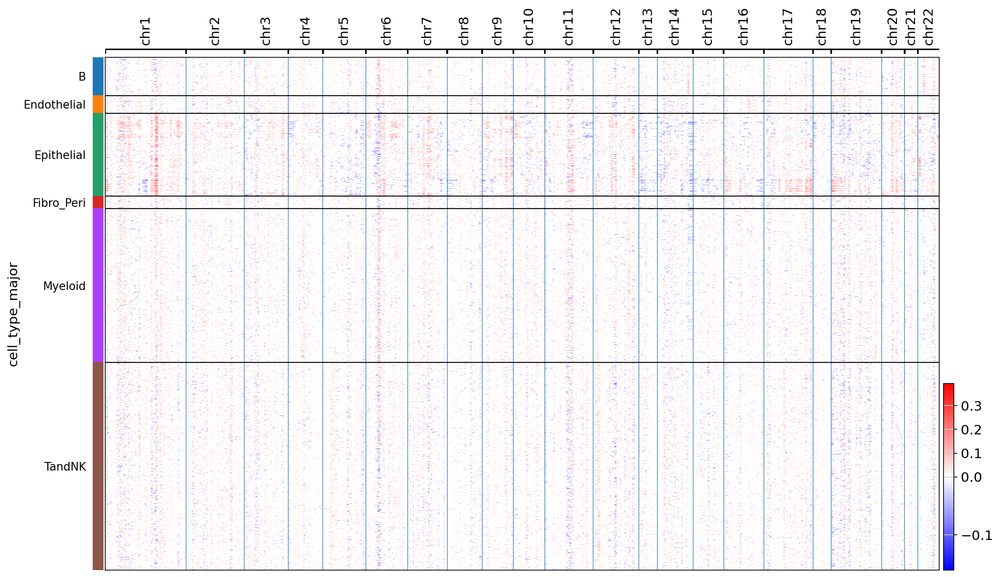

In [96]:
cnv.pl.chromosome_heatmap(adata_by_dataset[dataset], groupby="cell_type_major")

categories: 0, 1, 2, etc.
var_group_labels: chr1, chr2, chr3, etc.


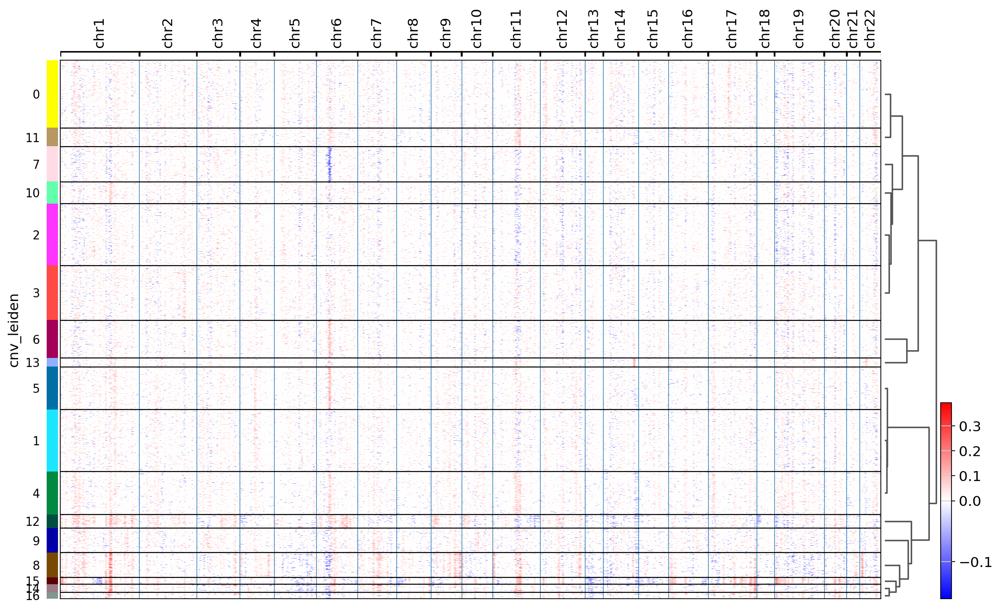

In [97]:
sc.tl.dendrogram(adata_by_dataset[dataset], groupby='cnv_leiden')
cnv.pl.chromosome_heatmap(adata_by_dataset[dataset], groupby="cnv_leiden", dendrogram=True)

In [101]:
# clu = ['1', '11', '14', '15']
# clu = ['10', '12', '13', '14', '15']
# clu = ['7', '10', '13', '14', '16', '17']
# clu = ['11']
# clu = ['12', '18', '21', '23', '14', '24', '15', '19', '11', '20', '9', '17', '8', '22', '16']
# clu = ['14', '11', '18', '12', '13', '15', '17', '16']
# clu = ['10', '12', '13']
clu = ['12', '8', '14', '16', '15']

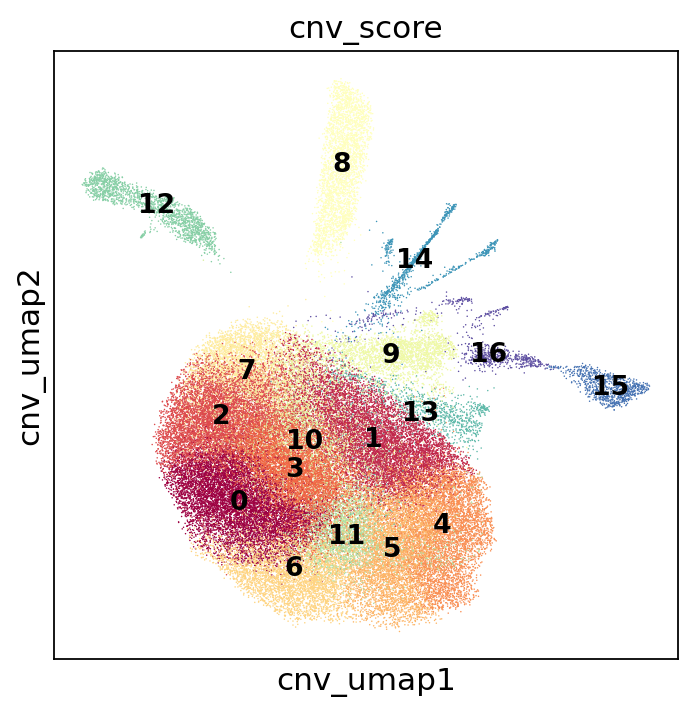

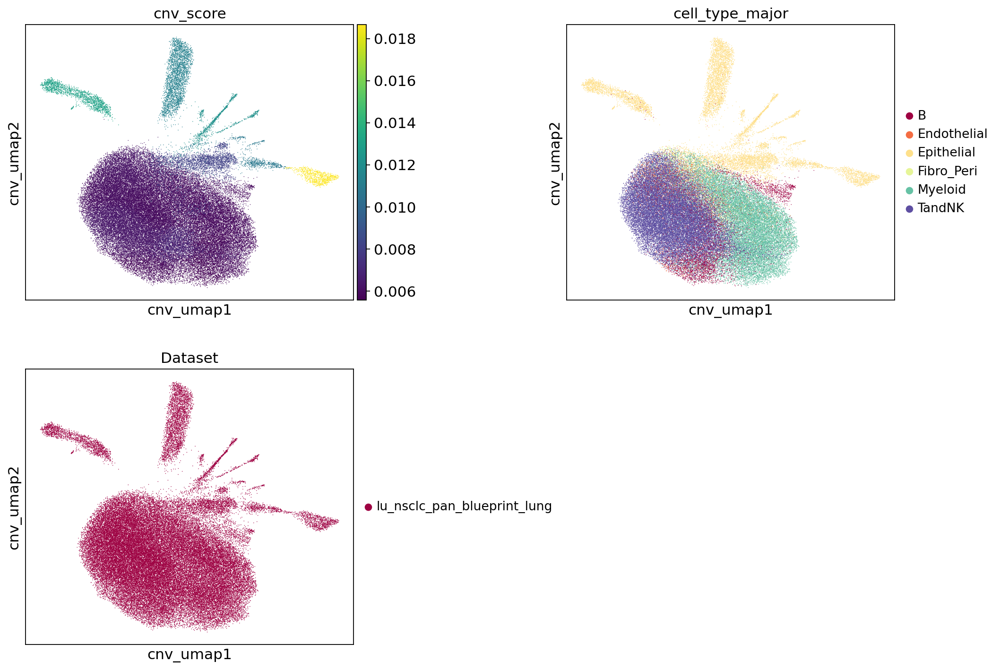

In [99]:
c_target = ['cnv_score', 'cell_type_major', 'Dataset']

sc.settings.set_figure_params(figsize=(5, 5), dpi=80, facecolor='white')
cnv.pl.umap(adata_by_dataset[dataset], color="cnv_leiden", legend_loc="on data", 
           wspace = 0.5,
           legend_fontsize = 12, title = c_target, 
           ncols = 2, palette = 'Spectral') 
cnv.pl.umap(adata_by_dataset[dataset], color=c_target, wspace = 0.5,
           legend_fontsize = 12, title = c_target, 
           ncols = 2, palette = 'Spectral') 

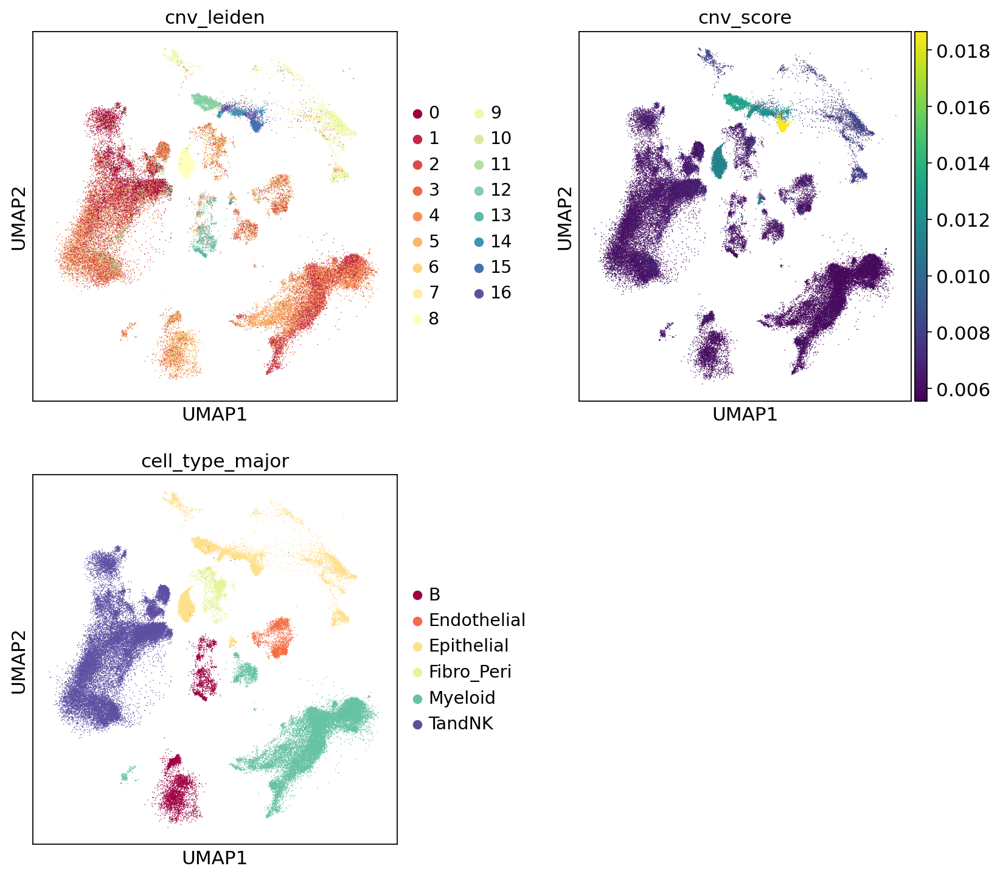

In [100]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(12, 11), gridspec_kw={"wspace": 0.5})
ax4.axis("off")
sc.pl.umap(adata_by_dataset[dataset], color="cnv_leiden", ax=ax1, show=False)
sc.pl.umap(adata_by_dataset[dataset], color="cnv_score", ax=ax2, show=False)
sc.pl.umap(adata_by_dataset[dataset], color="cell_type_major", ax=ax3)

In [102]:
adata_by_dataset[dataset].obs["cnv_status"] = "normal"
# adata_by_dataset[dataset].obs['cnv_status'] = adata_by_dataset[dataset].obs['cnv_status'].cat.add_categories(['tumor'])
adata_by_dataset[dataset].obs.loc[adata_by_dataset[dataset].obs["cnv_leiden"].isin(clu), "cnv_status"] = ("tumor")

In [103]:
adata_by_dataset[dataset].obs.cnv_status.value_counts()

cnv_status
normal    59173
tumor      7398
Name: count, dtype: int64

... storing 'cnv_status' as categorical


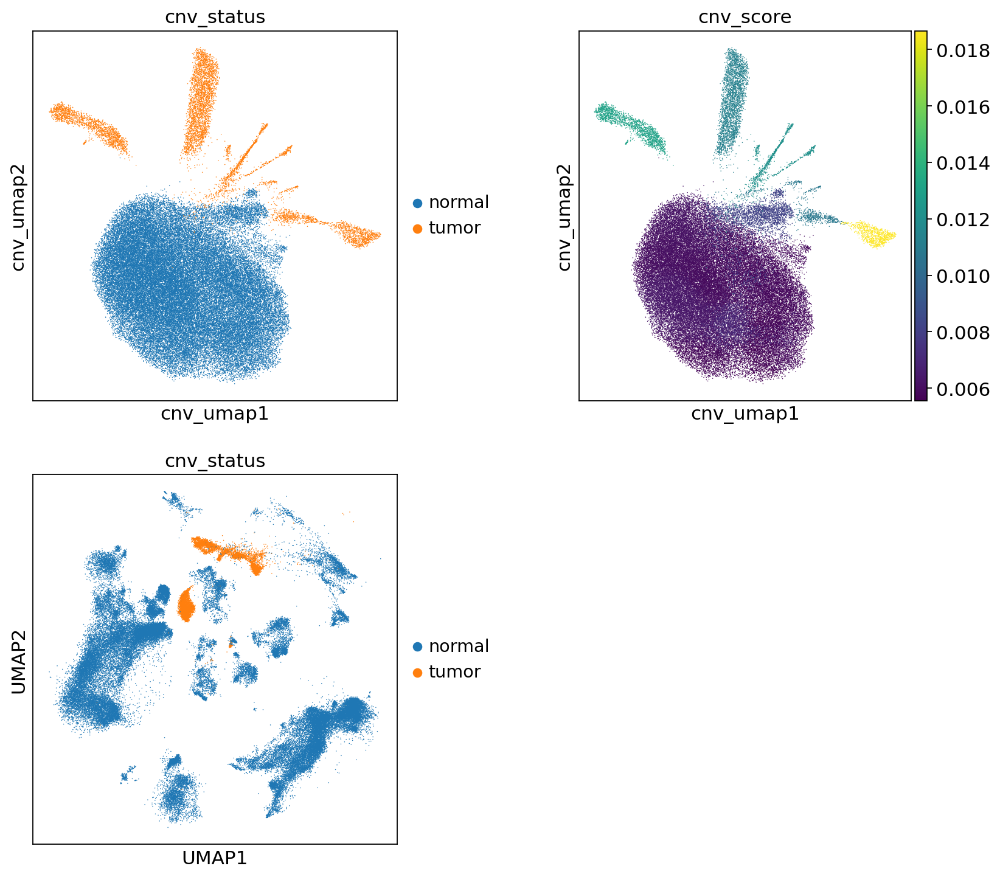

In [104]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(12, 11), gridspec_kw={"wspace": 0.5})
ax4.axis("off")
cnv.pl.umap(adata_by_dataset[dataset], color="cnv_status", ax=ax1, show=False)
cnv.pl.umap(adata_by_dataset[dataset], color="cnv_score", ax=ax2, show=False)
sc.pl.umap(adata_by_dataset[dataset], color="cnv_status", ax=ax3)

In [36]:
adata_by_dataset[dataset]
list(adata.obs['Dataset'].unique())

['pan_GSE140819',
 'lu_adc_GSE123902',
 'lu_HRA000154',
 'lung_hca_vieira',
 'lu_adc_GSE131907',
 'lu_adc_codeocean',
 'lu_adc_GSE146100',
 'lu_nsclc_pan_blueprint_lung']

## all datasets combine, raw adata tumor cell annotation

In [105]:
# 모든 데이터셋을 하나의 AnnData 객체로 합치기
all_datasets = list(adata_by_dataset.values())  # dict_values를 list로 변환
combined_adata = all_datasets[0].concatenate(*all_datasets[1:], index_unique=None)

# 결과 확인
combined_adata

/tmp/ipykernel_588387/1074503273.py:3: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  combined_adata = all_datasets[0].concatenate(*all_datasets[1:], index_unique=None)


AnnData object with n_obs × n_vars = 482351 × 36601
    obs: 'n_counts', 'n_genes', 'mito', 'Dataset', 'Organ_orig', 'Organ', 'Sample', 'Patient', 'Subtype', 'Tissue_site', 'Tissue', 'CancerType', 'DataOrgTis', 'PtOrgTis', 'SpOrgTis', 'leiden', 'cnv_status', 'cnv_leiden', 'cnv_score', 'anno_2402', 'cell_type_major', 'cell_type_minor', 'cell_type_subset', 'batch'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'chromosome', 'start', 'end', 'gene_id', 'gene_name'
    obsm: 'X_cnv', 'X_cnv_pca', 'X_cnv_umap', 'X_pca', 'X_umap'

In [106]:
adata = combined_adata

In [107]:
# 카테고리 추가
adata.obs['cell_type_major'] = adata.obs['cell_type_major'].cat.add_categories(['tumor'])
adata.obs['cell_type_minor'] = adata.obs['cell_type_minor'].cat.add_categories(['tumor'])
adata.obs['cell_type_subset'] = adata.obs['cell_type_subset'].cat.add_categories(['tumor'])

# 'leiden' 클러스터 44에 해당하는 세포의 인덱스를 찾기
cluster_indices = adata.obs['cnv_status'] == 'tumor'  # 이 부분을 원하는 클러스터 번호로 수정해야 합니다.

# 이 인덱스에 해당하는 'cell_type_major', 'cell_type_minor', 'cell_type_subset'를 'tumor'로 설정
adata.obs.loc[cluster_indices, 'cell_type_major'] = 'tumor'
adata.obs.loc[cluster_indices, 'cell_type_minor'] = 'tumor'
adata.obs.loc[cluster_indices, 'cell_type_subset'] = 'tumor'

# 변경 사항 확인
print(adata.obs['cell_type_major'].value_counts())
print(adata.obs['cell_type_minor'].value_counts())
print(adata.obs['cell_type_subset'].value_counts())

cell_type_major
TandNK         198879
Myeloid        131550
tumor           60143
B               40587
Epithelial      29105
Fibro_Peri      12105
Endothelial      9982
Name: count, dtype: int64
cell_type_minor
TandNK        198879
Myeloid       131550
tumor          60143
B              40587
Epithelial     29105
Fibro_Peri     12105
NEC             6451
TEC             3531
Name: count, dtype: int64
cell_type_subset
TandNK                 198879
Myeloid                131550
tumor                   60143
B                       40587
Epithelial              29105
Fibro_Peri              12105
activated capillary      4054
Immature_Phenotype       2264
capillary type I         1616
capillary type II         781
Tip_Cells                 733
Activated_EC              534
Name: count, dtype: int64


In [108]:
# 로드
path = '/home/nccpml/DATA2/hanbyeol/TEC/h5ad_data/'
adata2 = sc.read(path + 'CCA_Lung_reanno_0424.h5ad')

In [111]:
## epi 뽑아서 cell_type_major tumor cell 선택
# adata2의 인덱스 순서에 따라 adata1의 값을 매핑합니다.
adata2.obs['cnv_leiden'] = adata2.obs.index.map(adata.obs['cnv_leiden'])
adata2.obs['cnv_score'] = adata2.obs.index.map(adata.obs['cnv_score'])

# adata1에서 'tumor' 인 인덱스를 찾습니다.
tumor_indices_adata1 = adata.obs['cell_type_major'] == 'tumor'

# adata2에서 'Epi' 인 인덱스를 찾습니다.
epi_indices_adata2 = adata2.obs['cell_type_major'] == 'Epithelial'

# 공통 인덱스 찾기
common_indices = tumor_indices_adata1 & epi_indices_adata2

adata2.obs['cell_type_major'] = adata2.obs['cell_type_major'].cat.add_categories(['tumor'])
adata2.obs['cell_type_minor'] = adata2.obs['cell_type_minor'].cat.add_categories(['tumor'])
adata2.obs['cell_type_subset'] = adata2.obs['cell_type_subset'].cat.add_categories(['tumor'])
# adata2.obs['cnv_status'] = adata2.obs['cnv_status'].cat.add_categories(['tumor'])

# 공통된 인덱스를 사용하여 adata2의 'cell_type_major'를 'tumor'로 변경
adata2.obs.loc[common_indices, 'cell_type_major'] = 'tumor'
adata2.obs.loc[common_indices, 'cell_type_minor'] = 'tumor'
adata2.obs.loc[common_indices, 'cell_type_subset'] = 'tumor'
adata2.obs.loc[common_indices, 'cnv_status'] = 'tumor'

# 결과 확인
adata2.obs

,n_counts,n_genes,mito,Dataset,Organ_orig,Organ,Sample,Patient,Subtype,Tissue_site,...,PtOrgTis,SpOrgTis,leiden,cnv_status,cnv_leiden,cnv_score,anno_2402,cell_type_major,cell_type_minor,cell_type_subset
pan_GSE140819_GSM4186959_NSCLC17_fresh-PDEC_channel1_AAACCTGAGACCGGAT-1,7088.0,2072,0.047256,pan_GSE140819,Lung,Lung Cancer,GSM4186959_NSCLC17_fresh-PDEC_channel1,pan_GSE140819_NSCLC17,n/a,Primary_Tumor,...,pan_GSE140819_NSCLC17-Lung-Tumor,pan_GSE140819-GSM4186959_NSCLC17_fresh-PDEC_ch...,4,normal,3,0.005214,Myeloid,Myeloid,Myeloid,Myeloid
pan_GSE140819_GSM4186959_NSCLC17_fresh-PDEC_channel1_AAACCTGCAGTCACTA-1,4985.0,1269,0.024067,pan_GSE140819,Lung,Lung Cancer,GSM4186959_NSCLC17_fresh-PDEC_channel1,pan_GSE140819_NSCLC17,n/a,Primary_Tumor,...,pan_GSE140819_NSCLC17-Lung-Tumor,pan_GSE140819-GSM4186959_NSCLC17_fresh-PDEC_ch...,1,normal,12,0.005052,TandNK,TandNK,TandNK,TandNK
pan_GSE140819_GSM4186959_NSCLC17_fresh-PDEC_channel1_AAACCTGGTAAGTAGT-1,10007.0,2543,0.049760,pan_GSE140819,Lung,Lung Cancer,GSM4186959_NSCLC17_fresh-PDEC_channel1,pan_GSE140819_NSCLC17,n/a,Primary_Tumor,...,pan_GSE140819_NSCLC17-Lung-Tumor,pan_GSE140819-GSM4186959_NSCLC17_fresh-PDEC_ch...,4,normal,3,0.005214,Myeloid,Myeloid,Myeloid,Myeloid
pan_GSE140819_GSM4186959_NSCLC17_fresh-PDEC_channel1_AAACCTGTCGAATGCT-1,18045.0,4597,0.040231,pan_GSE140819,Lung,Lung Cancer,GSM4186959_NSCLC17_fresh-PDEC_channel1,pan_GSE140819_NSCLC17,n/a,Primary_Tumor,...,pan_GSE140819_NSCLC17-Lung-Tumor,pan_GSE140819-GSM4186959_NSCLC17_fresh-PDEC_ch...,31,tumor,11,0.015304,Epithelial,tumor,tumor,tumor
pan_GSE140819_GSM4186959_NSCLC17_fresh-PDEC_channel1_AAACCTGTCTGAGGGA-1,4937.0,1492,0.034629,pan_GSE140819,Lung,Lung Cancer,GSM4186959_NSCLC17_fresh-PDEC_channel1,pan_GSE140819_NSCLC17,n/a,Primary_Tumor,...,pan_GSE140819_NSCLC17-Lung-Tumor,pan_GSE140819-GSM4186959_NSCLC17_fresh-PDEC_ch...,16,normal,12,0.005052,Myeloid,Myeloid,Myeloid,Myeloid
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
pan_bluprint_lung_scrBT1432_TTTGCGCAGAGACTTA,2749.0,953,0.031273,lu_nsclc_pan_blueprint_lung,Lung,Lung Cancer,pan_blueprint_lung_scrBT1432,pan_bluprint_lung_8,n/a,Primary_Tumor,...,pan_bluprint_lung_8-Lung-Tumor,lu_nsclc_pan_blueprint_lung-pan_blueprint_lung...,33,normal,3,0.005909,TandNK,TandNK,TandNK,TandNK
pan_bluprint_lung_scrBT1432_TTTGCGCTCTTCAACT,6028.0,1639,0.023221,lu_nsclc_pan_blueprint_lung,Lung,Lung Cancer,pan_blueprint_lung_scrBT1432,pan_bluprint_lung_8,n/a,Primary_Tumor,...,pan_bluprint_lung_8-Lung-Tumor,lu_nsclc_pan_blueprint_lung-pan_blueprint_lung...,33,normal,3,0.005909,TandNK,TandNK,TandNK,TandNK
pan_bluprint_lung_scrBT1432_TTTGGTTCATTCTCAT,5192.0,1419,0.039091,lu_nsclc_pan_blueprint_lung,Lung,Lung Cancer,pan_blueprint_lung_scrBT1432,pan_bluprint_lung_8,n/a,Primary_Tumor,...,pan_bluprint_lung_8-Lung-Tumor,lu_nsclc_pan_blueprint_lung-pan_blueprint_lung...,33,normal,0,0.006357,TandNK,TandNK,TandNK,TandNK
pan_bluprint_lung_scrBT1432_TTTGTCACACATGTGT,1760.0,625,0.021579,lu_nsclc_pan_blueprint_lung,Lung,Lung Cancer,pan_blueprint_lung_scrBT1432,pan_bluprint_lung_8,n/a,Primary_Tumor,...,pan_bluprint_lung_8-Lung-Tumor,lu_nsclc_pan_blueprint_lung-pan_blueprint_lung...,1,normal,2,0.005982,TandNK,TandNK,TandNK,TandNK


In [ ]:
sc.pl.umap(adata2, color="cnv_status")
sc.pl.umap(adata2, color="anno_2402")

In [116]:
adata.to_df()

,MIR1302-2HG,FAM138A,OR4F5,AL627309.1,AL627309.3,AL627309.2,AL627309.5,AL627309.4,AP006222.2,AL732372.1,...,AC133551.1,AC136612.1,AC136616.1,AC136616.3,AC136616.2,AC141272.1,AC023491.2,AC007325.1,AC007325.4,AC007325.2
pan_GSE140819_GSM4186959_NSCLC17_fresh-PDEC_channel1_AAACCTGAGACCGGAT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.487043,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
pan_GSE140819_GSM4186959_NSCLC17_fresh-PDEC_channel1_AAACCTGCAGTCACTA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
pan_GSE140819_GSM4186959_NSCLC17_fresh-PDEC_channel1_AAACCTGGTAAGTAGT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.252388,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
pan_GSE140819_GSM4186959_NSCLC17_fresh-PDEC_channel1_AAACCTGTCGAATGCT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.125245,0.0
pan_GSE140819_GSM4186959_NSCLC17_fresh-PDEC_channel1_AAACCTGTCTGAGGGA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
pan_bluprint_lung_scrBT1432_TTTGCGCAGAGACTTA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
pan_bluprint_lung_scrBT1432_TTTGCGCTCTTCAACT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
pan_bluprint_lung_scrBT1432_TTTGGTTCATTCTCAT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
pan_bluprint_lung_scrBT1432_TTTGTCACACATGTGT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0


In [117]:
adata2.to_df()

,MIR1302-2HG,FAM138A,OR4F5,AL627309.1,AL627309.3,AL627309.2,AL627309.5,AL627309.4,AP006222.2,AL732372.1,...,AC133551.1,AC136612.1,AC136616.1,AC136616.3,AC136616.2,AC141272.1,AC023491.2,AC007325.1,AC007325.4,AC007325.2
pan_GSE140819_GSM4186959_NSCLC17_fresh-PDEC_channel1_AAACCTGAGACCGGAT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.887219,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
pan_GSE140819_GSM4186959_NSCLC17_fresh-PDEC_channel1_AAACCTGCAGTCACTA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
pan_GSE140819_GSM4186959_NSCLC17_fresh-PDEC_channel1_AAACCTGGTAAGTAGT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.699100,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
pan_GSE140819_GSM4186959_NSCLC17_fresh-PDEC_channel1_AAACCTGTCGAATGCT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.755377,0.0
pan_GSE140819_GSM4186959_NSCLC17_fresh-PDEC_channel1_AAACCTGTCTGAGGGA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
pan_bluprint_lung_scrBT1432_TTTGCGCAGAGACTTA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
pan_bluprint_lung_scrBT1432_TTTGCGCTCTTCAACT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
pan_bluprint_lung_scrBT1432_TTTGGTTCATTCTCAT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
pan_bluprint_lung_scrBT1432_TTTGTCACACATGTGT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0


In [ ]:
# 저장
path = '/home/nccpml/DATA2/hanbyeol/TEC/h5ad_data/'
adata2.write(path + 'CCA_Lung_tumor_reanno_0424.h5ad')
# # 로드
# path = '/home/nccpml/DATA2/hanbyeol/TEC/h5ad_data/'
# adata2 = sc.read(path + 'CCA_Lung_tumor_reanno_0424.h5ad')

## Epi inferCNV

In [180]:
# epi 추출
adata_epi = adata[adata.obs['cell_type_major'] == 'Epi'].copy()
adata_epi

AnnData object with n_obs × n_vars = 88080 × 36601
    obs: 'n_counts', 'n_genes', 'mito', 'Dataset', 'Organ_orig', 'Organ', 'Sample', 'Patient', 'Subtype', 'Tissue_site', 'Tissue', 'CancerType', 'DataOrgTis', 'PtOrgTis', 'SpOrgTis', 'leiden', 'cnv_leiden', 'cnv_score', 'cell_type_major', 'cell_type_minor', 'cell_type_subset', 'cnv_status'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'chromosome', 'start', 'end', 'gene_id', 'gene_name'
    uns: 'Dataset_colors', 'cell_type_major_colors', 'cell_type_minor_colors', 'cell_type_subset_colors', 'cnv', 'cnv_leiden_colors', 'cnv_neighbors', 'cnv_status_colors', 'dendrogram_cnv_leiden', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_cnv', 'X_cnv_pca', 'X_cnv_umap', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'cnv_neighbors_connectivities', 'cnv_neighbors_distances', 'connectivities', 'distances'

In [181]:
# 'Dataset' 열에서 중복된 값을 제거
datasets = adata_epi.obs['Dataset'].drop_duplicates().tolist()

adata_by_dataset = {}

# 각 데이터셋에 대한 부분집합 생성
for dataset in datasets:
    adata_by_dataset[dataset] = adata_epi[adata_epi.obs['Dataset'] == dataset]
    globals()[f"adata_by_{dataset}"] = adata_by_dataset[dataset]

# 결과 확인
for dataset, subset_adata in adata_by_dataset.items():
    print(f"Dataset: {dataset}, Number of cells: {len(subset_adata)}")

Dataset: pan_GSE140819, Number of cells: 3289
Dataset: lu_adc_GSE123902, Number of cells: 3753
Dataset: lu_HRA000154, Number of cells: 12402
Dataset: lung_hca_vieira, Number of cells: 3056
Dataset: lu_adc_GSE131907, Number of cells: 35144
Dataset: lu_adc_codeocean, Number of cells: 18793
Dataset: lu_adc_GSE146100, Number of cells: 1299
Dataset: lu_nsclc_pan_blueprint_lung, Number of cells: 10344


In [161]:
## param
ref_key = 'cell_type_major'
ref_types = list(adata_epi.obs[ref_key].unique())
use_ref = True

N_pca_comp = 15
N_neighbors = 10
Window_size = 250

In [162]:
# 각 데이터셋에 대해 반복
for dataset_name, dataset in adata_by_dataset.items():
    # infercnv 분석 수행   
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        cnv.tl.infercnv(dataset, 
                        reference_key = ref_key, 
                        reference_cat = ref_types, 
                        window_size = Window_size)
    
    # PCA, 이웃 찾기, 클러스터링, UMAP, CNV 점수 계산
    # PCA, neighbors, leiden, UMAP, cnv_score 계산
    cnv.tl.pca(dataset, svd_solver='arpack', n_comps = N_pca_comp) 
    cnv.pp.neighbors(dataset, key_added = 'cnv_neighbors', n_neighbors=N_neighbors, n_pcs=N_pca_comp)
    cnv.tl.leiden(dataset, neighbors_key='cnv_neighbors', key_added='cnv_leiden', resolution = 1)
    
    cnv.tl.umap(dataset, neighbors_key='cnv_neighbors')
    cnv.tl.cnv_score(dataset, groupby = 'cnv_leiden', key_added = 'cnv_score')

# # 모든 데이터셋을 하나의 AnnData 객체로 합치기
# all_datasets = list(adata_by_dataset.values())  # dict_values를 list로 변환
# combined_adata = all_datasets[0].concatenate(*all_datasets[1:], index_unique=None)

# # 결과 확인
# print(combined_adata)
    # # cnv_score를 기반으로 cnv_status 업데이트
    # dataset.obs["cnv_status"] = "normal"
    # dataset.obs.loc[dataset.obs["cnv_score"] > 0.006, "cnv_status"] = "tumor"


  0%|          | 0/1 [00:00<?, ?it/s]

/home/hanbyeol/.conda/envs/py39/lib/python3.9/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


  0%|          | 0/1 [00:00<?, ?it/s]

/home/hanbyeol/.conda/envs/py39/lib/python3.9/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


  0%|          | 0/3 [00:00<?, ?it/s]

/home/hanbyeol/.conda/envs/py39/lib/python3.9/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


  0%|          | 0/1 [00:00<?, ?it/s]

/home/hanbyeol/.conda/envs/py39/lib/python3.9/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


  0%|          | 0/8 [00:00<?, ?it/s]

/home/hanbyeol/.conda/envs/py39/lib/python3.9/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


  0%|          | 0/4 [00:00<?, ?it/s]

/home/hanbyeol/.conda/envs/py39/lib/python3.9/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


  0%|          | 0/1 [00:00<?, ?it/s]

/home/hanbyeol/.conda/envs/py39/lib/python3.9/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


  0%|          | 0/3 [00:00<?, ?it/s]

/home/hanbyeol/.conda/envs/py39/lib/python3.9/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


In [167]:
adata_epi

AnnData object with n_obs × n_vars = 88080 × 36601
    obs: 'n_counts', 'n_genes', 'mito', 'Dataset', 'Organ_orig', 'Organ', 'Sample', 'Patient', 'Subtype', 'Tissue_site', 'Tissue', 'CancerType', 'DataOrgTis', 'PtOrgTis', 'SpOrgTis', 'leiden', 'cnv_leiden', 'cnv_score', 'cell_type_major', 'cell_type_minor', 'cell_type_subset', 'cnv_status'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'chromosome', 'start', 'end', 'gene_id', 'gene_name'
    uns: 'Dataset_colors', 'cell_type_major_colors', 'cell_type_minor_colors', 'cell_type_subset_colors', 'cnv', 'cnv_leiden_colors', 'cnv_neighbors', 'cnv_status_colors', 'dendrogram_cnv_leiden', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_cnv', 'X_cnv_pca', 'X_cnv_umap', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'cnv_neighbors_connectivities', 'cnv_neighbors_distances', 'connectivities', 'distances'

In [168]:
list(adata.obs['Dataset'].unique())

['pan_GSE140819',
 'lu_adc_GSE123902',
 'lu_HRA000154',
 'lung_hca_vieira',
 'lu_adc_GSE131907',
 'lu_adc_codeocean',
 'lu_adc_GSE146100',
 'lu_nsclc_pan_blueprint_lung']

In [169]:
dataset = 'pan_GSE140819'

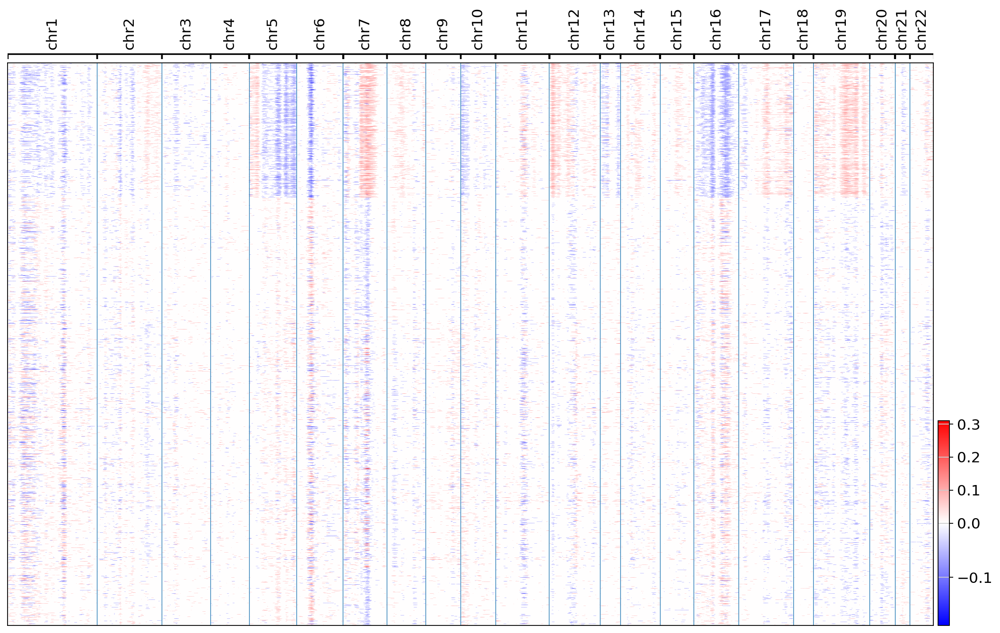

In [176]:
cnv.pl.chromosome_heatmap(adata_by_dataset[dataset], groupby="cell_type_major")

categories: 0, 1, 2, etc.
var_group_labels: chr1, chr2, chr3, etc.


/home/hanbyeol/.conda/envs/py39/lib/python3.9/site-packages/scanpy/tools/_dendrogram.py:135: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_df = rep_df.groupby(level=0).mean()


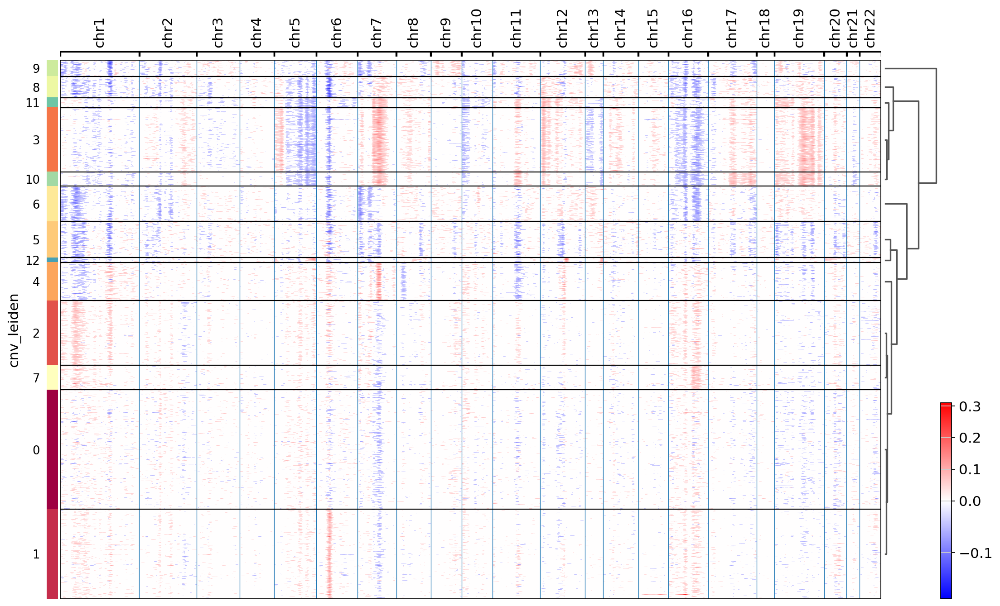

In [177]:
sc.tl.dendrogram(adata_by_dataset[dataset], groupby='cnv_leiden')
cnv.pl.chromosome_heatmap(adata_by_dataset[dataset], groupby="cnv_leiden", dendrogram=True)

/home/hanbyeol/.conda/envs/py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/hanbyeol/.conda/envs/py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


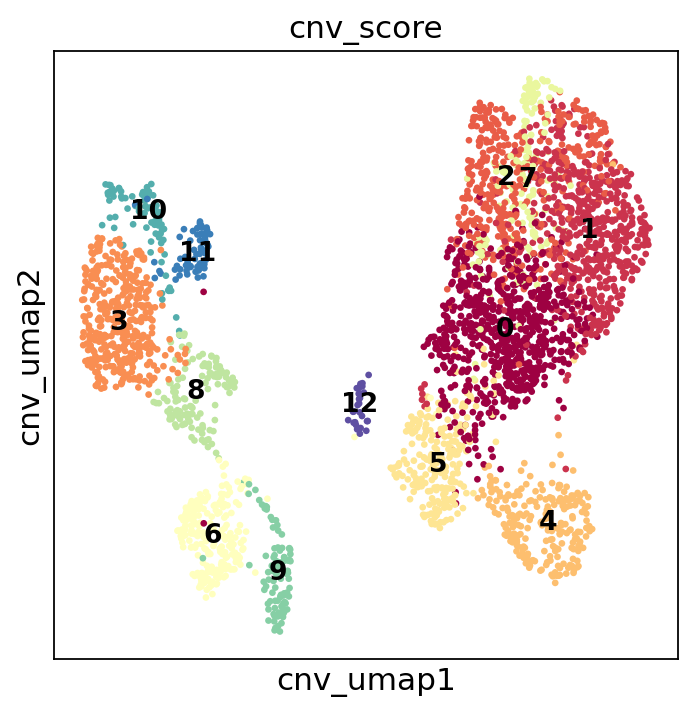

/home/hanbyeol/.conda/envs/py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/hanbyeol/.conda/envs/py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/hanbyeol/.conda/envs/py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_m

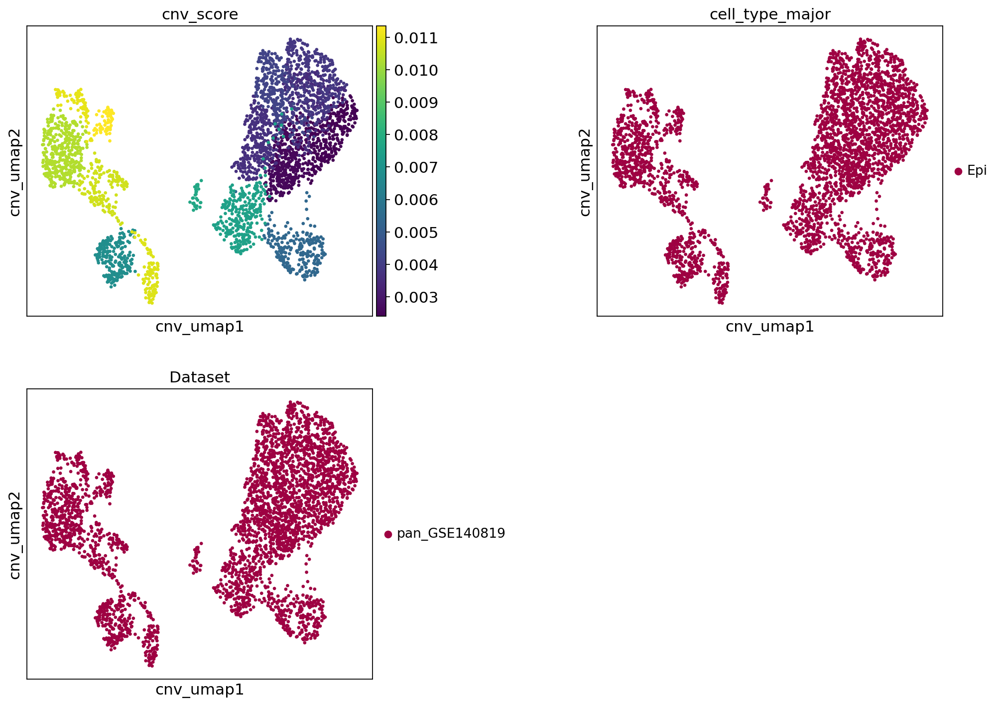

In [178]:
c_target = ['cnv_score', 'cell_type_major', 'Dataset']

sc.settings.set_figure_params(figsize=(5, 5), dpi=80, facecolor='white')
cnv.pl.umap(adata_by_dataset[dataset], color="cnv_leiden", legend_loc="on data", 
           wspace = 0.5,
           legend_fontsize = 12, title = c_target, 
           ncols = 2, palette = 'Spectral') 
cnv.pl.umap(adata_by_dataset[dataset], color=c_target, wspace = 0.5,
           legend_fontsize = 12, title = c_target, 
           ncols = 2, palette = 'Spectral') 

/home/hanbyeol/.conda/envs/py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/hanbyeol/.conda/envs/py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/hanbyeol/.conda/envs/py39/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_m

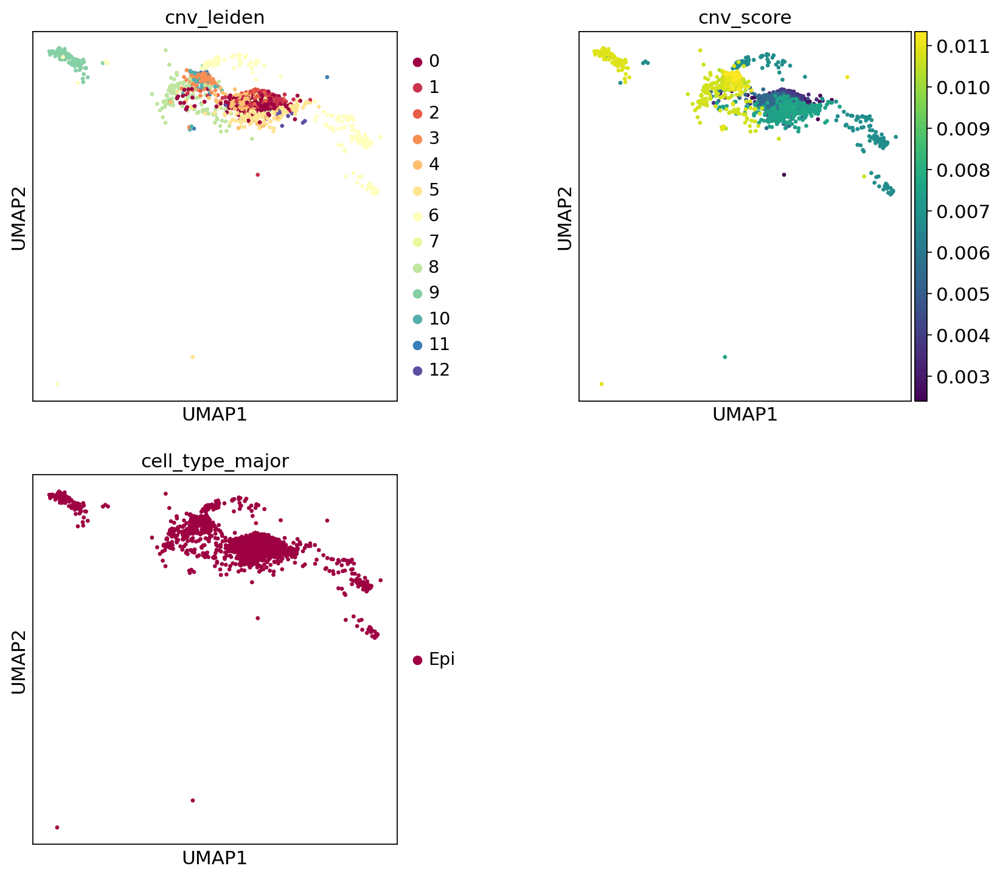

In [179]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(12, 11), gridspec_kw={"wspace": 0.5})
ax4.axis("off")
sc.pl.umap(adata_by_dataset[dataset], color="cnv_leiden", ax=ax1, show=False)
sc.pl.umap(adata_by_dataset[dataset], color="cnv_score", ax=ax2, show=False)
sc.pl.umap(adata_by_dataset[dataset], color="cell_type_major", ax=ax3)

In [ ]:
adata_by_dataset[dataset].obs["cnv_status"] = "normal"
# adata_by_dataset[dataset].obs['cnv_status'] = adata_by_dataset[dataset].obs['cnv_status'].cat.add_categories(['tumor'])
adata_by_dataset[dataset].obs.loc[adata_by_dataset[dataset].obs["cnv_leiden"].isin([
    '18','19', '17']), "cnv_status"] = ("tumor")

In [ ]:
adata_by_dataset[dataset].obs.cnv_status.value_counts()

In [ ]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(12, 11), gridspec_kw={"wspace": 0.5})
ax4.axis("off")
cnv.pl.umap(adata_by_dataset[dataset], color="cnv_status", ax=ax1, show=False)
cnv.pl.umap(adata_by_dataset[dataset], color="cnv_score", ax=ax2, show=False)
sc.pl.umap(adata_by_dataset[dataset], color="cnv_status", ax=ax3)

In [ ]:
path = '/home/nccpml/DATA2/hanbyeol/TEC/h5ad_data/'
adata.write(path + 'CCA_Lung_lite.h5ad')